# Исследование объявлений о продаже квартир

В вашем распоряжении данные сервиса Яндекс.Недвижимость — архив объявлений о продаже квартир в Санкт-Петербурге и соседних населённых пунктов за несколько лет. Нужно научиться определять рыночную стоимость объектов недвижимости. Ваша задача — установить параметры. Это позволит построить автоматизированную систему: она отследит аномалии и мошенническую деятельность. 

По каждой квартире на продажу доступны два вида данных. Первые вписаны пользователем, вторые — получены автоматически на основе картографических данных. Например, расстояние до центра, аэропорта, ближайшего парка и водоёма. 

### Откройте файл с данными и изучите общую информацию. 

In [1]:
!pip install geopy

     |████████████████████████████████| 118 kB 2.5 MB/s eta 0:00:01


In [2]:
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import numpy as np

from geopy.geocoders import Nominatim
from geopy import distance

import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

In [3]:
try:
    data = pd.read_csv('real_estate_data.csv', sep='\t')
except FileNotFoundError:
    data = pd.read_csv('/datasets/real_estate_data.csv', sep='\t')

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23699 entries, 0 to 23698
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   total_images          23699 non-null  int64  
 1   last_price            23699 non-null  float64
 2   total_area            23699 non-null  float64
 3   first_day_exposition  23699 non-null  object 
 4   rooms                 23699 non-null  int64  
 5   ceiling_height        14504 non-null  float64
 6   floors_total          23613 non-null  float64
 7   living_area           21796 non-null  float64
 8   floor                 23699 non-null  int64  
 9   is_apartment          2775 non-null   object 
 10  studio                23699 non-null  bool   
 11  open_plan             23699 non-null  bool   
 12  kitchen_area          21421 non-null  float64
 13  balcony               12180 non-null  float64
 14  locality_name         23650 non-null  object 
 15  airports_nearest   

In [4]:
data = data.rename(
    columns={
        'cityCenters_nearest': 'city_centers_nearest',
        'parks_around3000': 'parks_around_3000',
        'ponds_around3000': 'ponds_around_3000'
    }
)

In [5]:
data.duplicated().sum()

0

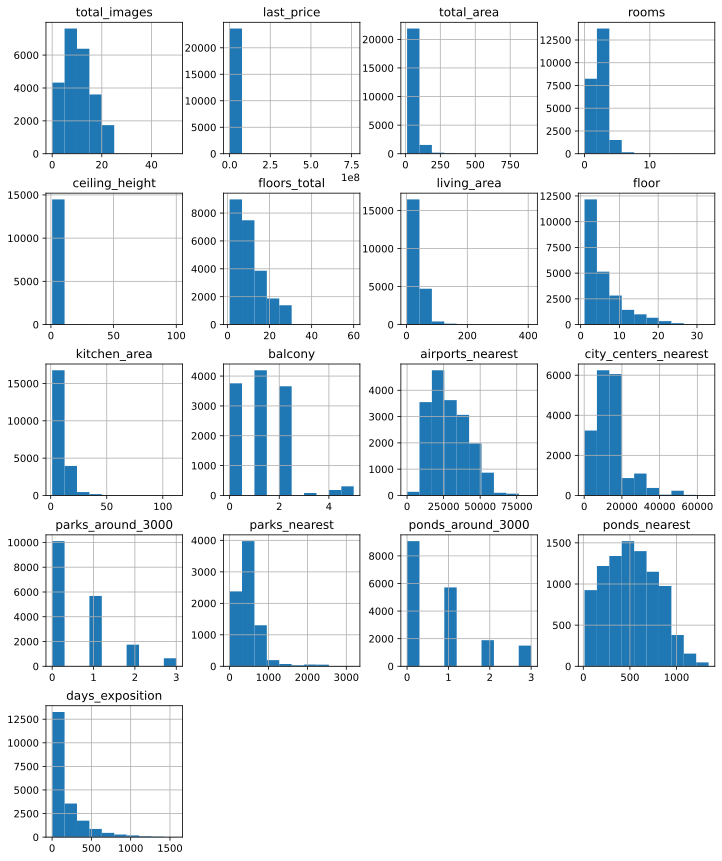

In [6]:
data.hist(figsize=(12, 15));

### Предобработка данных

#### Заполнение пропусков

In [7]:
data.isna().sum(axis=0)

total_images                0
last_price                  0
total_area                  0
first_day_exposition        0
rooms                       0
ceiling_height           9195
floors_total               86
living_area              1903
floor                       0
is_apartment            20924
studio                      0
open_plan                   0
kitchen_area             2278
balcony                 11519
locality_name              49
airports_nearest         5542
city_centers_nearest     5519
parks_around_3000        5518
parks_nearest           15620
ponds_around_3000        5518
ponds_nearest           14589
days_exposition          3181
dtype: int64

посмотрим на масштаб проблемы

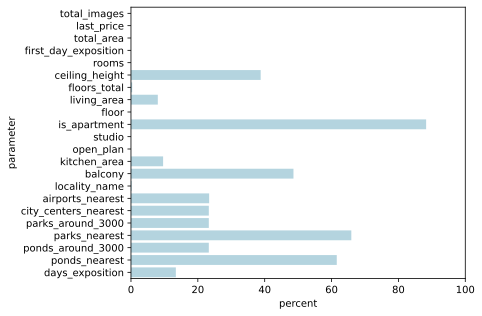

In [8]:
na_count = pd.DataFrame(data.isna().sum(axis=0)).rename(columns={0: "nans"}).reset_index()
na_count['percent'] = 100 * na_count['nans'] / data.shape[0]

fig, ax = plt.subplots(figsize=(6, 5))
sns.barplot(data=na_count, y='index', x='percent', orient='h', ax=ax, color='lightblue')
ax.set(xlim = (0, 100), ylabel="parameter");

Пропусков довольно много, тут трудно найти с чего лучше начать... 
Мне кажется, что некоторые пропуски можно восстанавливать, сравнивая похожесть домов. Например, у нас есть пропуски в `locality_name` и есть два параметра, определяющих довольно четко положение дома - это `airports_nearest` и `city_centers_nearest`. По ним можно будет примерно восстановить названия недостающих населенных пунктов (далее буду сокращать как нп) следующим образом: 
1. принять значения из `airports_nearest` и `city_centers_nearest` за двумерный вектор
2. оценить насколько близки друг к другу вектора с известными нп и тот, где мы хотим восстановить значение
3. восстановленное значение нп будет соответствовать названию ближайшего найденного вектора


* __locality_name__

Для начала исключим все строки, где `locality_name`, `airports_nearest`, `city_centers_nearest` неопределены, так как их восстановить не удастся 

In [9]:
rows = data['locality_name'].isna() & data['airports_nearest'].isna() & data['city_centers_nearest'].isna()

In [10]:
rows.sum()

8

In [11]:
data = data[~rows]
data = data.reset_index(drop=True)

Заберем только нужные столбцы и исключим те, где есть хотя бы один пропуск, чтобы у нас не попались вектора типа: [nan, 10] или [10, nan]

In [12]:
subset = data[['locality_name', 'airports_nearest', 'city_centers_nearest']]
subset = subset.dropna()

Идея функции в том, чтобы посчитать евклидово расстояние между вектором x (где неизвестна локация) и всеми остальными. Далее, найти индекс ближайшего вектора и проверить насколько удален от нас этот вектор, если он сильно далеко, то будем говорить, что нп определить не удалось. За это будет отвечать параметр `min_dist`. В случае, когда ближайший вектор достаточно близко мы будем возвращать название нп.

In [13]:
def closest_locality(x: np.array, min_dist: int = 2000):
    vector = subset[['airports_nearest', 'city_centers_nearest']].values
    distancies = np.linalg.norm(vector - x, axis=1)
    if min(distancies) >= min_dist:
        return 'unknown'
    else:
        nearest_index = np.argsort(distancies)[0]        
        return subset.iloc[nearest_index]['locality_name']


Отбираем строки для восстановления

In [14]:
rows = data['locality_name'].isna()
unknowns = data.loc[rows, ['airports_nearest', 'city_centers_nearest']]

In [15]:
for line, item in unknowns.iterrows():
    data.loc[line, 'locality_name'] = closest_locality(item.values, 2000)

In [16]:
data['locality_name'].isna().sum()

0

Теперь хочется до конца разобраться со столбцом `locality_name`, чтобы к нему уже не возращаться. Поэтому попробуем привести его к единому формату и поискать дубликаты.

Приводим к одному виду

In [17]:
data['locality_name'] = data['locality_name'].str.lower()
data['locality_name'] = data['locality_name'].str.replace('ё', 'е')
data['locality_name'] = data['locality_name'].str.replace('имени ', '')
data['locality_name'] = data['locality_name'].str.replace('городской поселок ', 'поселок городского типа ')
data['locality_name'] = data['locality_name'].str.replace('садоводческое некоммерческое товарищество', 'садовое товарищество')

Теперь почистим опечатки и дубликаты: поселок N, поселок городского типа N. 

In [18]:
towns = sorted(data['locality_name'].unique().astype(str))
towns

['бокситогорск',
 'волосово',
 'волхов',
 'всеволожск',
 'выборг',
 'высоцк',
 'гатчина',
 'деревня агалатово',
 'деревня аро',
 'деревня батово',
 'деревня бегуницы',
 'деревня белогорка',
 'деревня большая вруда',
 'деревня большая пустомержа',
 'деревня большие колпаны',
 'деревня большое рейзино',
 'деревня большой сабск',
 'деревня бор',
 'деревня борисова грива',
 'деревня ваганово',
 'деревня вартемяги',
 'деревня вахнова кара',
 'деревня выскатка',
 'деревня гарболово',
 'деревня глинка',
 'деревня горбунки',
 'деревня гостилицы',
 'деревня заклинье',
 'деревня заневка',
 'деревня зимитицы',
 'деревня извара',
 'деревня иссад',
 'деревня калитино',
 'деревня кальтино',
 'деревня камышовка',
 'деревня каськово',
 'деревня келози',
 'деревня кипень',
 'деревня кисельня',
 'деревня колтуши',
 'деревня коркино',
 'деревня котлы',
 'деревня кривко',
 'деревня кудрово',
 'деревня кузьмолово',
 'деревня курковицы',
 'деревня куровицы',
 'деревня куттузи',
 'деревня лаврики',
 'деревня

Идея в том, чтобы пока убрать из названий все типы нп и отсортировать. Так все повторения и опечатки будут видны намного лучше

In [19]:
locality_types = [
    'садовое товарищество', 'деревня',
    'поселок городского типа', 'коттеджный поселок', 'поселок', 'село'
]

In [20]:
basic_locality_names = []
for town in towns:
    for loc_type in locality_types:
        if loc_type in town:
            town = town.replace(loc_type, "").strip() + " " + loc_type
            break
    basic_locality_names.append(town)
basic_locality_names.sort()

In [21]:
basic_locality_names

['агалатово деревня',
 'александровская поселок',
 'алексеевка поселок',
 'аннино поселок',
 'аро деревня',
 'барышево поселок',
 'батово деревня',
 'бегуницы деревня',
 'белогорка деревня',
 'белоостров поселок',
 'бокситогорск',
 'большая вруда деревня',
 'большая ижора поселок городского типа',
 'большая пустомержа деревня',
 'большие колпаны деревня',
 'большое рейзино деревня',
 'большой сабск деревня',
 'бор деревня',
 'борисова грива деревня',
 'бугры поселок',
 'будогощь поселок городского типа',
 'ваганово деревня',
 'важины поселок городского типа',
 'вартемяги деревня',
 'вахнова кара деревня',
 'виллози поселок городского типа',
 'вознесенье поселок городского типа',
 'возрождение поселок',
 'войсковицы поселок',
 'войскорово поселок',
 'володарское поселок',
 'волосово',
 'волхов',
 'всеволожск',
 'выборг',
 'вырица поселок городского типа',
 'выскатка деревня',
 'высокоключевой поселок',
 'высоцк',
 'гаврилово поселок',
 'гарболово деревня',
 'гарболово поселок',
 'гатчин

Теперь действительно видно лучше. Здесь попадаются схожие названия нп, но с разным проставленным типом:
>'гарболово деревня'<->'гарболово поселок'

Их, вероятно, нужно проверять вручную. Также я заметил, что названия без приставок вероятнее всего являются городами.

In [22]:
data['locality_name'] = data['locality_name'].str.\
    replace('поселок гарболово', 'деревня гарболово').\
    replace('жил', 'жилгородок').\
    replace('деревня зимитицы', 'поселок зимитицы').\
    replace('кудрово деревня', 'кудрово').\
    replace('поселок мурино', 'мурино').\
    replace('садовое товарищество рахья', 'поселок городского типа рахья').\
    replace('поселок рябово', 'поселок городского типа рябово').\
    replace('деревня федоровское', 'поселок городского типа федоровское')

Вернемся к заполнению пропусков

In [23]:
data.isna().sum()

total_images                0
last_price                  0
total_area                  0
first_day_exposition        0
rooms                       0
ceiling_height           9189
floors_total               86
living_area              1902
floor                       0
is_apartment            20921
studio                      0
open_plan                   0
kitchen_area             2276
balcony                 11515
locality_name               0
airports_nearest         5534
city_centers_nearest     5511
parks_around_3000        5510
parks_nearest           15612
ponds_around_3000        5510
ponds_nearest           14581
days_exposition          3180
dtype: int64

Попробуем разобраться с числом балконов. В описании проекта предлагается заполнить нулями все значения NaN, так как, если  продавец не указал число балконов, то, вероятно, их нет

In [24]:
data['balcony'] = data['balcony'].fillna(0)

In [25]:
data['balcony'].isna().sum()

0

* __living_area__ и __kitchen_area__

Теперь будем восстанавливать значения площадей `living_area`. Для этого построим сводную таблицу, так как значения числовые, то будем брать медианное значение. Также, наверное, имеет смысл рассматривать в каком населенном пункте находится квартира. Например, в деревнях и селах это могут быть частные дома. Санкт-Петербург тоже выделяется на фоне остальных городов в области, поэтому сделаем его также отдельной категорией

In [26]:
def setting_locality_type(locality):
    if 'садовое товарищество' in locality:
        value = 1
    elif 'деревня' in locality:
        value = 2
    elif 'поселок городского типа' in locality:
        value = 3
    elif 'коттеджный поселок' in locality:
        value = 4
    elif 'поселок' in locality:
        value = 5
    elif 'село' in locality:
        value = 6
    elif 'санкт-петербург' in locality:
        value = 7
    else:  # 8 будет обозначать "город"
        value = 8
    return value

In [27]:
data['locality_type'] = data['locality_name'].apply(lambda x: setting_locality_type(x)) 

В данных о числе комнат есть аномалии. Например, число комнат равное нулю или с 19 комнатами, но малой для такого числа площадью. Чтобы можно было распределить наши неопределенные значения разберемся с этими аномалиями сейчас.

In [28]:
data.loc[data['rooms'] == 0, ['studio', 'total_area', 'living_area', 'kitchen_area']]

,studio,total_area,living_area,kitchen_area
144,True,27.00,15.50,NaN
349,False,25.00,17.00,NaN
440,True,27.11,24.75,NaN
508,False,34.40,24.30,NaN
608,True,25.00,NaN,NaN
...,...,...,...,...
23202,True,26.00,18.00,NaN
23434,False,27.70,18.00,NaN
23546,True,26.00,NaN,NaN
23584,False,29.00,18.00,NaN


Везде где есть пометка, что это студия можно поставить, что число комнат не 0, а 1

In [29]:
rows = (data['rooms'] == 0) & data['studio']
data.loc[rows, 'rooms'] = 1

In [30]:
print(len(data.loc[data['rooms'] == 0]))

59


Осталось 59 случаев, попробуем заполнить число комнат, соотнося общую площадь `total_area` и тип населенного пункта `locality_type`.

In [31]:
rows = data['rooms'] > 0

In [32]:
non_zero_rooms = data[rows].pivot_table(
    index='locality_type', 
    columns='rooms', 
    values='total_area', 
    aggfunc='median'
)
non_zero_rooms

rooms,1,2,3,4,5,6,7,8,9,10,11,12,14,15,16,19
locality_type,,,,,,,,,,,,,,,,
1,37.0,56.00,61.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,36.0,53.52,73.70,73.2,170.00,192.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,35.0,49.00,64.20,72.0,101.45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,63.5,53.60,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,37.0,53.00,74.00,100.1,112.00,NaN,201.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,32.7,46.80,70.95,98.0,NaN,320.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,37.1,54.10,75.00,104.0,150.00,183.7,214.0,235.0,300.95,272.6,188.9,900.0,304.2,590.0,270.0,374.6
8,35.0,51.00,68.00,79.0,108.10,158.2,374.0,347.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


 Используем ту же самую схему, что и при восстановлении `locality_name`. Только теперь вектор будет одномерный, так как `locality_type` мы знаем 

In [33]:
for line, item in data.loc[data['rooms'] == 0].iterrows():
    vector = non_zero_rooms.loc[item['locality_type'], :].values
    vector = vector.reshape((-1, 1)) # делаем столбец
    dist = np.linalg.norm(vector - item['living_area'], axis=1)
    data.loc[line, 'rooms'] = np.argsort(dist)[0] + 1

Строим получившуюся табличку

In [34]:
living_area_table = data.pivot_table(
    columns='rooms', 
    index='locality_type', 
    values='living_area', 
    aggfunc='median', 
    fill_value=0
)
living_area_table

rooms,1,2,3,4,5,6,7,8,9,10,11,12,14,15,16,19
locality_type,,,,,,,,,,,,,,,,
1,12.00,32.50,44.00,0.000000,0.0,0.00,0.0,0,0.0,0.0,0.0,0.0,0.00,0,0,0.0
2,17.10,30.00,44.85,55.500000,92.0,147.20,0.0,0,0.0,0.0,0.0,0.0,0.00,0,0,0.0
3,17.35,29.80,43.45,47.000000,69.8,0.00,0.0,0,0.0,0.0,0.0,0.0,0.00,0,0,0.0
4,38.00,28.40,0.00,0.000000,0.0,0.00,0.0,0,0.0,0.0,0.0,0.0,0.00,0,0,0.0
5,17.00,30.00,44.85,61.150002,67.0,0.00,0.0,0,0.0,0.0,0.0,0.0,0.00,0,0,0.0
6,17.50,29.65,45.00,66.000000,0.0,190.00,0.0,0,0.0,0.0,0.0,0.0,0.00,0,0,0.0
7,18.00,31.00,45.80,65.500000,95.0,123.90,145.0,162,179.2,161.4,133.9,409.7,195.15,409,180,264.5
8,17.20,30.00,43.00,53.800000,71.0,80.95,239.4,160,0.0,0.0,0.0,0.0,0.00,0,0,0.0


В целом значения везде ровные за исключением коттеджных поселков и случаев с большим числом комнат в санкт-петербурге и деревнях. Тем не менее при заполнении пропусков будем учитывать и тип локации

In [35]:
def fill_living_area(x):
    return living_area_table.loc[x['locality_type'], x['rooms']]

In [36]:
rows = data['living_area'].isna()
data.loc[rows, 'living_area'] = data.loc[rows].apply(fill_living_area, axis=1)

In [37]:
data.isna().sum()

total_images                0
last_price                  0
total_area                  0
first_day_exposition        0
rooms                       0
ceiling_height           9189
floors_total               86
living_area                 0
floor                       0
is_apartment            20921
studio                      0
open_plan                   0
kitchen_area             2276
balcony                     0
locality_name               0
airports_nearest         5534
city_centers_nearest     5511
parks_around_3000        5510
parks_nearest           15612
ponds_around_3000        5510
ponds_nearest           14581
days_exposition          3180
locality_type               0
dtype: int64

Заполнять пропуски в `kitchen_area` таким же способом не получается, так выходит около 400 случаев, когда сумма площадей кухни и жилой больше общей. Поэтому эти пропуски я оставлю как есть

* __ponds_nearest__, __ponds_around_3000__, __parks_nearest__, __parks_around_3000__

Тут наверное лучше не трогать пропуски, так как если непонятно как восстановить значение. Единственное можно проверить, что в тех местах, где количество парков или прудов задано как 0, то и в расстояниях должен быть nan


In [38]:
data['parks_nearest'] = data['parks_nearest'].where(data['parks_around_3000'] > 0, np.nan)
data['ponds_nearest'] = data['ponds_nearest'].where(data['ponds_around_3000'] > 0, np.nan)

In [39]:
data.isna().sum()

total_images                0
last_price                  0
total_area                  0
first_day_exposition        0
rooms                       0
ceiling_height           9189
floors_total               86
living_area                 0
floor                       0
is_apartment            20921
studio                      0
open_plan                   0
kitchen_area             2276
balcony                     0
locality_name               0
airports_nearest         5534
city_centers_nearest     5511
parks_around_3000        5510
parks_nearest           15616
ponds_around_3000        5510
ponds_nearest           14581
days_exposition          3180
locality_type               0
dtype: int64

* __is_apartament__

Здесь слишком много пропусков и лучше исключить эту колонку вовсе, такое ощущение, что колонка была включена уже по походу составления таблицы и данные в нем просто не накопились.


In [40]:
data = data.drop(columns='is_apartment')

* __floors_total__

Пропущенных значений мало, около 0.4%, поэтому можно их исключить

In [41]:
data = data[~data['floors_total'].isna()]
data = data.reset_index(drop=True)

In [42]:
data.isna().sum(axis=0)

total_images                0
last_price                  0
total_area                  0
first_day_exposition        0
rooms                       0
ceiling_height           9112
floors_total                0
living_area                 0
floor                       0
studio                      0
open_plan                   0
kitchen_area             2229
balcony                     0
locality_name               0
airports_nearest         5524
city_centers_nearest     5501
parks_around_3000        5500
parks_nearest           15564
ponds_around_3000        5500
ponds_nearest           14544
days_exposition          3171
locality_type               0
dtype: int64

* __airports_nearest__ и __city_centers_nearest__

Чтобы восстановить эти данные воспользуемся библиотекой [geopy](https://geopy.readthedocs.io/en/stable/) и найдем координаты центра Петербурга, аэропорта Пулково и координаты населенных пунктов по названию. После чего посчитаем расстояние

In [43]:
loc = Nominatim(user_agent="GetLoc")

In [44]:
airport_info, airport_coords = loc.geocode('аэропорт пулково')
print(airport_info)

Пулково, Ново-Койровское шоссе, округ Горелово, Санкт-Петербург, Северо-Западный федеральный округ, 198260, Россия


In [45]:
spb_info, spb_coords = loc.geocode('санкт-петербург')
print(spb_info)

Санкт-Петербург, Северо-Западный федеральный округ, Россия


Расстояние будем считать так

In [46]:
distance.distance(spb_coords, airport_coords).meters

15508.02192792926

In [47]:
rows = data['airports_nearest'].isna() | data['city_centers_nearest'].isna()

In [48]:
unique_locality = data.loc[rows, 'locality_name'].unique()

Для нахождения координат предварительно сделаем следующее:
1. Уберем из названий типы населенных пунктов. Это нужно по крайней мере потому что 'поселок городского типа' не ищется
2. Сверка по широте и долготе. Россия большая, нужно проверять, что название из нужного региона

In [49]:
def clear_locality_name(s):
    s = s.replace('садовое товарищество', ''). \
             replace('деревня', ''). \
             replace('поселок городского типа', ''). \
             replace('коттеджный поселок', ''). \
             replace('поселок', ''). \
             replace('при железнодорожной станции', ''). \
             replace('станции', ''). \
             replace('платформа', ''). \
             replace('село', '').strip()
    return s

In [50]:
# У меня обкачивалось около 3х минут
dct = {}
for num, item in enumerate(data.loc[rows, 'locality_name'].unique(), 1):
    item = clear_locality_name(item)
    candidates = loc.geocode(item, exactly_one=False)
    for candidate in candidates:
        # Если не найдем такой населенный пункт, то пропустим его
        if ("Ленинградская область" in candidate[0]) or ("Санкт-Петербург" in candidate[0]):
            # Заберем только координаты
            dct[item] = candidate[1]
            break
    print(f"{num / len(unique_locality):<4.1%} {item:<40}", end='\r')


Теперь восстановим пропуски

In [51]:
def fill_distancies(x, source):
    place = dct.get(clear_locality_name(x))
    if place:
        return distance.distance(source, place).meters
    # Этот случай нужен, так как мы могли и не найти нужный населенный пункт и будет None
    # вместо координат. Тогда distance выдаст неправильный результат
    else: 
        return np.nan

In [52]:
# аааээропорты
rows = data['airports_nearest'].isna()
data.loc[rows, 'airports_nearest'] = data.loc[rows, 'locality_name'].apply(
    func=fill_distancies, 
    args=(airport_coords, )
)

In [53]:
# иии городааа
rows = data['city_centers_nearest'].isna()
data.loc[rows, 'city_centers_nearest'] = data.loc[rows, 'locality_name'].apply(
    func=fill_distancies, 
    args=(spb_coords, )
)

In [54]:
rows = data['airports_nearest'].isna() | data['city_centers_nearest'].isna()
rows.sum()

251

На данный момент осталось 251 пропуск из более чем 5000 изначально, то есть примерно 1% от всего датасета и я думаю ими можно пожертвовать, чтобы избежать выскакиваний NaN'ов при анализе

In [55]:
data = data[~rows]

In [56]:
data.isna().sum(axis=0)

total_images                0
last_price                  0
total_area                  0
first_day_exposition        0
rooms                       0
ceiling_height           9004
floors_total                0
living_area                 0
floor                       0
studio                      0
open_plan                   0
kitchen_area             2207
balcony                     0
locality_name               0
airports_nearest            0
city_centers_nearest        0
parks_around_3000        5249
parks_nearest           15313
ponds_around_3000        5249
ponds_nearest           14293
days_exposition          3125
locality_type               0
dtype: int64

* __days_exposition__ - количество дней, которое висело объявление

Тут не знаю как подступиться, даже если квартиры похожи, то все равно не факт, что их купят за одинаковый промежуток времени. Может, тут какой-нибудь второстепенный признак играет важную роль - типо количества и качества фотографий или риэлтор, который занимался сделкой. 

Думаю, что стоит оставить как есть пропусков в этом столбце 14%, что немало, конечно, но не хочется, чтобы в этом столбце появилась некоторая предвзятость из-за заполнения медианой или средним значением.

* __ceiling_height__ 

В условии нам опять подсказывают, что в этом параметре есть рукописные опечатки. Попробуем исправить некоторые из них 

In [57]:
# data = pd.read_csv('clean_data.csv', index_col=0)

In [58]:
data['ceiling_height'].describe()

count    14350.000000
mean         2.771272
std          1.253968
min          1.000000
25%          2.520000
50%          2.650000
75%          2.800000
max        100.000000
Name: ceiling_height, dtype: float64

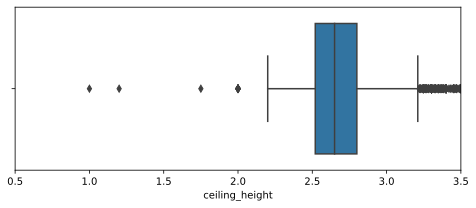

In [59]:
fig, ax = plt.subplots(figsize=(8, 3))
sns.boxplot(data=data, x='ceiling_height', ax=ax)
ax.set(xlim=(0.5, 3.5));

Выглядит жутковато, есть квартира с высотой полотков в 100м o_O

[Тут](https://www.dp.ru/a/2016/10/27/Dostich_potolka) говорят, что бывают до 10 метров. Поверим этому странному сайту и исправим опечатки, где человек ошибся на порядок.

In [60]:
rows = data.query('25 < ceiling_height < 33').index
data.loc[rows, 'ceiling_height'] = data.loc[rows, 'ceiling_height'] / 10

In [61]:
rows = (data['ceiling_height'] < 2.5) | (data['ceiling_height'] > 10.1)
rows.sum()

83

Оставшиеся аномалии предлагается удалить, их всего 83 штуки

In [62]:
data = data[~rows]

Теперь заполним пропуски. На этом же [сайте](https://www.dp.ru/a/2016/10/27/Dostich_potolka) в разделе "Исторически сложилось" пишут, что чем древнее дом, тем выше у него высота потолков. Дата постройки нам не дана. Однако наверняка самые старые дома находятся в центре. Чтобы это проверить разбьем на несколько групп по удалению от центра (просто группировать по расстояния напрямую получается каша из-за того, что `city_centers_nearest` количественная переменная)

In [63]:
def spb_region(x): 
    if x < 2000:
        return "центр"
    elif x < 5000:
        return "город"
    elif x < 20000:
        return "окраина"
    else:
        return "остальное"

In [64]:
data['remotness'] = data.loc[:, 'city_centers_nearest'].apply(spb_region)

In [65]:
height_from_center = data.groupby('remotness')['ceiling_height'].agg(['mean', 'median'])
height_from_center['order'] = [1, 2, 3, 0] 
height_from_center = height_from_center.sort_values(by='order')
height_from_center

,mean,median,order
remotness,,,
центр,3.201622,3.17,0
город,3.152627,3.10,1
окраина,2.700668,2.65,2
остальное,2.640272,2.59,3


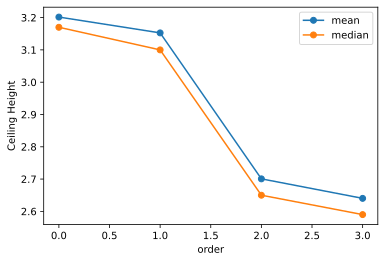

In [66]:
height_from_center.plot(y=['mean', 'median'], x='order', marker='o')
plt.ylabel('Ceiling Height');

Зависимость есть, на сигмоиду перевернутую похоже)
Давайте в этот раз возьмем среднее значение - разница небольшая

In [67]:
rows = data.loc[:, 'ceiling_height'].isna()

In [68]:
data.loc[rows, 'ceiling_height'] = data.loc[rows, 'remotness'].apply(
    lambda x: height_from_center.loc[x, 'mean'].round(1)
)

In [69]:
data.loc[:, 'ceiling_height'] = data.loc[:, 'ceiling_height'].round(1)

In [70]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23271 entries, 0 to 23604
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   total_images          23271 non-null  int64  
 1   last_price            23271 non-null  float64
 2   total_area            23271 non-null  float64
 3   first_day_exposition  23271 non-null  object 
 4   rooms                 23271 non-null  int64  
 5   ceiling_height        23271 non-null  float64
 6   floors_total          23271 non-null  float64
 7   living_area           23271 non-null  float64
 8   floor                 23271 non-null  int64  
 9   studio                23271 non-null  bool   
 10  open_plan             23271 non-null  bool   
 11  kitchen_area          21073 non-null  float64
 12  balcony               23271 non-null  float64
 13  locality_name         23271 non-null  object 
 14  airports_nearest      23271 non-null  float64
 15  city_centers_neares

Посмотрим теперь на количество пропусков

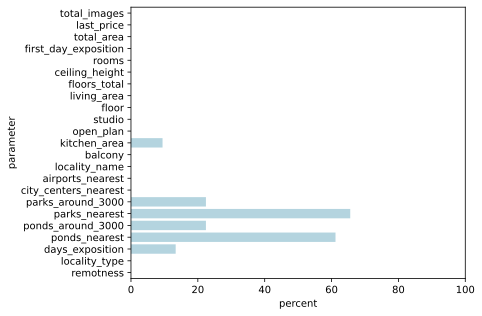

In [71]:
na_count = pd.DataFrame(data.isna().sum(axis=0)).rename(columns={0: "nans"}).reset_index()
na_count['percent'] = 100 * na_count['nans'] / data.shape[0]

fig, ax = plt.subplots(figsize=(6, 5))
sns.barplot(data=na_count, y='index', x='percent', orient='h', ax=ax, color='lightblue')
ax.set(xlim = (0, 100), ylabel="parameter");

Неидально, конечено, но лучше, чем было

#### Корректирование типов данных

In [72]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23271 entries, 0 to 23604
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   total_images          23271 non-null  int64  
 1   last_price            23271 non-null  float64
 2   total_area            23271 non-null  float64
 3   first_day_exposition  23271 non-null  object 
 4   rooms                 23271 non-null  int64  
 5   ceiling_height        23271 non-null  float64
 6   floors_total          23271 non-null  float64
 7   living_area           23271 non-null  float64
 8   floor                 23271 non-null  int64  
 9   studio                23271 non-null  bool   
 10  open_plan             23271 non-null  bool   
 11  kitchen_area          21073 non-null  float64
 12  balcony               23271 non-null  float64
 13  locality_name         23271 non-null  object 
 14  airports_nearest      23271 non-null  float64
 15  city_centers_neares

Обязательным для перевода является только столбец `first_day_exposition`. Его нужно перевести во временной формат. Еще в этом столбце часы, минуты и секунды проставлены нулями, но я думаю, что их значение некритично.

Еще можно для удобства сделать столбцы `floors_total` и `balcony` целочисленного формата

In [73]:
data.head(2)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,studio,...,locality_name,airports_nearest,city_centers_nearest,parks_around_3000,parks_nearest,ponds_around_3000,ponds_nearest,days_exposition,locality_type,remotness
0,20,13000000.0,108.0,2019-03-07T00:00:00,3,2.7,16.0,51.0,8,False,...,санкт-петербург,18863.0,16028.0,1.0,482.0,2.0,755.0,NaN,7,окраина
1,7,3350000.0,40.4,2018-12-04T00:00:00,1,2.7,11.0,18.6,1,False,...,поселок шушары,12817.0,18603.0,0.0,NaN,0.0,NaN,81.0,5,окраина


In [74]:
data['first_day_exposition'] = pd.to_datetime(data['first_day_exposition'], format="%Y-%m-%dT%H:%M:%S")

In [75]:
data['balcony'] = data['balcony'].astype(int)
data['floors_total'] = data['floors_total'].astype(int)

In [76]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23271 entries, 0 to 23604
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   total_images          23271 non-null  int64         
 1   last_price            23271 non-null  float64       
 2   total_area            23271 non-null  float64       
 3   first_day_exposition  23271 non-null  datetime64[ns]
 4   rooms                 23271 non-null  int64         
 5   ceiling_height        23271 non-null  float64       
 6   floors_total          23271 non-null  int64         
 7   living_area           23271 non-null  float64       
 8   floor                 23271 non-null  int64         
 9   studio                23271 non-null  bool          
 10  open_plan             23271 non-null  bool          
 11  kitchen_area          21073 non-null  float64       
 12  balcony               23271 non-null  int64         
 13  locality_name   

In [77]:
data['last_price'] = data['last_price'].astype(int)

#### Учет аномалий

Мы частично затронули обратботку аномалий в столбце `ceiling_height`. В нем я удалил из данных значения меньшие 2.5 м и большие 10.1. По графику было еще много выпадающих значений. Они в основном относятся к элитному жилью.

Вообще от выбросов принято избавляться.. Просто тогда мы уславливаемся, что не учитываем при анализе элитное жилье. Его, если нужно, необходимо рассматривать отдельно

In [78]:
data.describe()

,total_images,last_price,total_area,rooms,ceiling_height,floors_total,living_area,floor,kitchen_area,balcony,airports_nearest,city_centers_nearest,parks_around_3000,parks_nearest,ponds_around_3000,ponds_nearest,days_exposition,locality_type
count,23271.000000,2.327100e+04,23271.000000,23271.000000,23271.000000,23271.000000,23271.000000,23271.000000,21073.000000,23271.000000,23271.000000,23271.000000,18053.000000,8008.000000,18053.000000,9034.000000,20159.000000,23271.000000
mean,9.880624,6.589672e+06,60.469832,2.081303,2.725835,10.729664,34.391841,5.904860,10.583986,0.591509,35087.879053,23059.311833,0.610646,489.253122,0.770232,518.371153,181.218116,6.791973
std,5.683337,1.097230e+07,35.841973,1.069204,0.247845,6.608580,21.803988,4.890056,5.925604,0.960386,27645.953834,29580.103754,0.801969,336.878868,0.939298,277.891576,220.312207,1.310300
min,0.000000,1.219000e+04,12.000000,1.000000,2.500000,1.000000,0.000000,1.000000,1.300000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,13.000000,1.000000,1.000000
25%,6.000000,3.450000e+06,40.000000,1.000000,2.600000,5.000000,18.400000,2.000000,7.000000,0.000000,19644.000000,10820.000000,0.000000,287.750000,0.000000,294.000000,45.000000,7.000000
50%,9.000000,4.670000e+06,52.000000,2.000000,2.700000,9.000000,30.000000,4.000000,9.200000,0.000000,29007.054807,14049.000000,0.000000,454.000000,1.000000,503.000000,95.000000,7.000000
75%,14.000000,6.800000e+06,70.000000,3.000000,2.700000,16.000000,42.800000,8.000000,12.000000,1.000000,39751.000000,20720.308764,1.000000,612.000000,1.000000,730.000000,232.000000,7.000000
max,50.000000,7.630000e+08,900.000000,19.000000,8.300000,60.000000,409.700000,33.000000,112.000000,5.000000,317228.714762,308018.590423,3.000000,2984.000000,3.000000,1344.000000,1580.000000,8.000000


Почти везде есть сильно выделяющиеся максимальные значения, попробуем построить boxplot для некоторых категорий

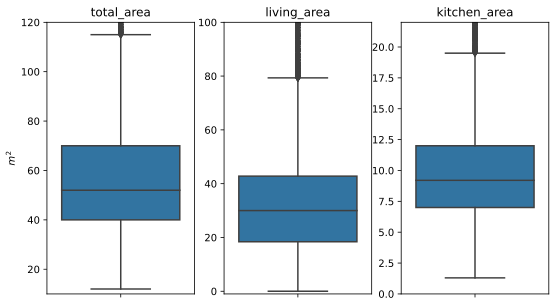

In [79]:
fig, ax = plt.subplots(1, 3, figsize=(9, 5))
labels = ['total_area', 'living_area', 'kitchen_area']
for i in range(3):
    sns.boxplot(ax=ax[i], data=data, y=labels[i])
    ax[i].set_title(labels[i])
    ax[i].set_ylabel("")
ax[0].set_ylabel(r"$m^2$")
ax[0].set_ylim(10, 120)
ax[1].set_ylim(-1, 100)
ax[2].set_ylim(0, 22);

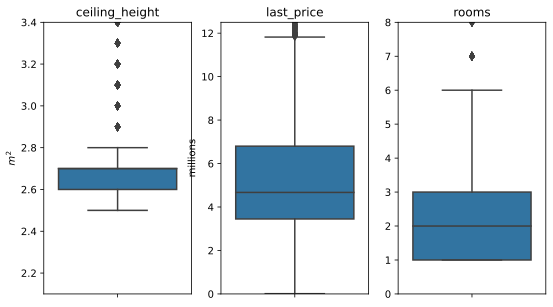

In [80]:
fig, ax = plt.subplots(1, 3, figsize=(9, 5))

sns.boxplot(ax=ax[0], data=data, y='ceiling_height')
sns.boxplot(ax=ax[1], data=data[['last_price']] / 1e06, y='last_price')
sns.boxplot(ax=ax[2], data=data, y='rooms')
ax[0].set(
    title='ceiling_height', 
    ylabel=r'$m^2$',
    ylim=(2.1, 3.4)
)
ax[1].set(
    title='last_price', 
    ylabel='millions',
    ylim=(0, 12.5)
)
ax[2].set(
    title='rooms', 
    ylabel='',
    ylim=(0, 8)
);

Теперь делаем срезы по границам. Единственное, тут видно, что после заполнений пропущенных значений "уехали" показатели у `ceiling_height`. Но мы знаем, что квартиры с потолками в 3.2 метра должны быть и это не ошибка, поэтому я расширю границу

In [81]:
# new_data = data.query("(last_price <= 12_000_000) and (2.5 <= ceiling_height <= 3.3)")
# new_data = new_data.query("(12 <= total_area < 118) and (living_area <= 80) and (kitchen_area <= 18)")
# new_data = new_data.query("rooms <= 6")
# new_data = new_data.reset_index(drop=True)

* __kitchen_area__ 

Попробуем заполнить пропуски следующим образом:
1. Сгруппируем данные по числу комнат в квартире
2. Найдем медианное значение отношения площади кухни к общей площади
3. Заполним пропуски, домножив отношения из пункта 2. на общую площадь квартиры, если жилая и кухонная площадь не превысит общую

In [82]:
data['kitchen_to_total'] = data['kitchen_area'] / data['total_area']
kitchen_table = data.pivot_table(index='rooms', values='kitchen_to_total', aggfunc=['mean', 'median'])
kitchen_table.columns = ['mean', 'median']

In [83]:
kitchen_table.head(6)

,mean,median
rooms,,
1,0.249987,0.248175
2,0.174255,0.161074
3,0.140899,0.128571
4,0.124021,0.112069
5,0.113547,0.105418
6,0.103428,0.098853


In [84]:
def fill_kitchens(x):
    value = kitchen_table.loc[x['rooms'], 'median']
    new_kitchen_area = value * x['total_area']
    if new_kitchen_area + x['living_area'] > x['total_area']:
        return np.nan
    return new_kitchen_area
    

In [85]:
rows = data['kitchen_area'].isna()
data.loc[rows, 'kitchen_area'] = data.loc[rows].apply(fill_kitchens, axis=1)
data['kitchen_area'].isna().sum()

134

Удалось проставить около двух тысяч значений

* __Удаление аномальных значений__

Теперь рассчитаем границы через iqr метод для отсечения аномалий как описано [тут](https://pythobyte.com/detection-removal-outliers-in-python-adaa857e/)

In [86]:
def bounds(x, coef=1.5):
    q1 = x.quantile(0.25)
    q3 = x.quantile(0.75)
    iqr = q3 - q1
    return  q1 - coef * iqr, q3 + coef * iqr

In [87]:
cols_to_reduce = [
    'total_area', 'ceiling_height', 
    'last_price', 'living_area', 'rooms'
]

In [88]:
bounds_table = data.loc[:, cols_to_reduce].apply(bounds, args=(1.7, ), axis=0, result_type='reduce')
bounds_table

total_area                    (-11.0, 121.0)
ceiling_height    (2.4299999999999997, 2.87)
last_price          (-2245000.0, 12495000.0)
living_area                  (-23.08, 84.28)
rooms                            (-2.4, 6.4)
dtype: object

В табличке получились нижние границы не физичные, но формуле не противоречит. В данном случае эти значения можно заменить на минимальные значения для каждого признака - на результат не повлияет.

Но можно и не менять)

Единственное, что не нравится это значения, которые получились для высоты потолков. Вернем 3.3 для верхней границы. Еще слегка расширим верхнюю границу для `last_price`

In [89]:
bounds_table.loc['ceiling_height'] = (2.4, 3.3)
bounds_table.loc['last_price'] = (0, 13_000_000)

Теперь делаем срезы. Идея будет в том, чтобы создать булевый массив полностью из `True` значений. 
Далее, для каждого признака с помощью метода `between` мы будем получать также булевый массив, который при перемножении на начальный будет выкалывать значения вне диапазона.

In [90]:
rows_to_keep = np.ones(data.shape[0], dtype=bool)

In [91]:
for feature in bounds_table.index:
    left, right = bounds_table[feature]
    rows_to_keep &= data.loc[:, feature].between(left, right, inclusive='both')

In [92]:
new_data = data[rows_to_keep]

In [93]:
new_data.shape[0] / 23699

0.8924005232288282

Значения с NaN все равно выкололись, но из-за того, что мы дополнительно заполнили пропуски в `kitchen_area`, это стало не критично, так как мы удержали 89% данных.

Здесь оставляем только те числовые признаки, которые есть в начальном и новом датасетах

In [95]:
cols_to_compare = set(new_data.columns) & set(data.columns)
# Удаляем эти четыре столбца, это не числовые типы 
cols_to_compare -= {'studio', 'locality_name', 'remotness', 'open_plan'}
len(cols_to_compare)

20

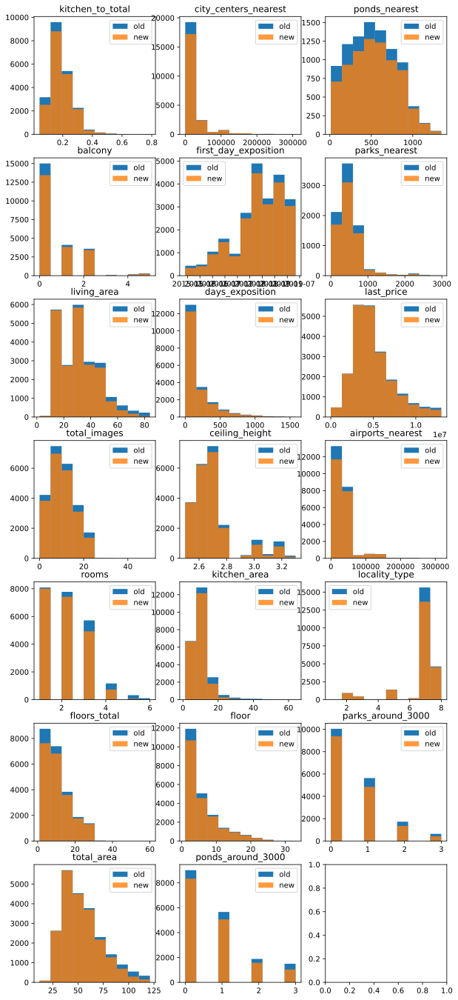

In [96]:
fig, ax = plt.subplots(7, 3, figsize=(10, 24))
for axis, col in zip(ax.flatten(), cols_to_compare):
    
    _range = new_data[col].min(), new_data[col].max()
    axis.hist(data[col], range=_range, alpha=1)
    axis.hist(new_data[col], range=_range, alpha=0.8)
    axis.set(title=col)
    axis.legend(['old', 'new'])
    

В итоге имеем следующий датасет

In [97]:
new_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21149 entries, 0 to 23604
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   total_images          21149 non-null  int64         
 1   last_price            21149 non-null  int64         
 2   total_area            21149 non-null  float64       
 3   first_day_exposition  21149 non-null  datetime64[ns]
 4   rooms                 21149 non-null  int64         
 5   ceiling_height        21149 non-null  float64       
 6   floors_total          21149 non-null  int64         
 7   living_area           21149 non-null  float64       
 8   floor                 21149 non-null  int64         
 9   studio                21149 non-null  bool          
 10  open_plan             21149 non-null  bool          
 11  kitchen_area          21029 non-null  float64       
 12  balcony               21149 non-null  int64         
 13  locality_name   

После всех чисток и преобразований снова проверим на дубликаты.

In [98]:
new_data.duplicated().sum()

0

### Посчитайте и добавьте в таблицу новые столбцы
Теперь займемся добавлением новых признаков для последующего анализа

1. Стоимость квадратного метра

In [99]:
new_data['price_per_m2'] = new_data['last_price'] / new_data['total_area']

/tmp/ipykernel_32/1085446538.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_data['price_per_m2'] = new_data['last_price'] / new_data['total_area']


2. Номер дня публикации объявления

In [100]:
new_data['first_day'] = new_data['first_day_exposition'].apply(lambda x: x.weekday())

/tmp/ipykernel_32/568243011.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_data['first_day'] = new_data['first_day_exposition'].apply(lambda x: x.weekday())


3. Месяц дня публикации объявления

In [101]:
new_data['first_month'] = new_data['first_day_exposition'].apply(lambda x: x.month)

/tmp/ipykernel_32/1765139802.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_data['first_month'] = new_data['first_day_exposition'].apply(lambda x: x.month)


4. Год дня публикации объявления

In [102]:
new_data['first_year'] = new_data['first_day_exposition'].apply(lambda x: x.year)

/tmp/ipykernel_32/3646860300.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_data['first_year'] = new_data['first_day_exposition'].apply(lambda x: x.year)


5. Тип этажа квартиры

In [103]:
def flat_type(x, max_level):
    if x == 1:
        value = "первый"
    elif x < max_level:
        value = "другой"
    else:
        value = "последний"
    return value

In [104]:
for num, item in new_data.iterrows():
    new_data.loc[num, 'flat_type'] = flat_type(item['floor'], item['floors_total'])

/opt/conda/lib/python3.9/site-packages/pandas/core/indexing.py:1599: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = infer_fill_value(value)
/opt/conda/lib/python3.9/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


6. Расстояние до центра города (км)

In [105]:
new_data['city_centers_km'] = new_data['city_centers_nearest'] / 1000
new_data['city_centers_km'] = new_data['city_centers_km'].round(0)

/tmp/ipykernel_32/1154241060.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_data['city_centers_km'] = new_data['city_centers_nearest'] / 1000
/tmp/ipykernel_32/1154241060.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_data['city_centers_km'] = new_data['city_centers_km'].round(0)


### Проведите исследовательский анализ данных

#### Задание 1. Изучение данных

In [106]:
to_watch = [
    'total_area', 'living_area', 'kitchen_area', 'last_price', 'rooms', 
    'ceiling_height', 'floor', 'flat_type', 'floors_total', 
    'airports_nearest', 'parks_nearest', 'first_day', 'first_month'
]

In [107]:
new_data[to_watch].describe()

,total_area,living_area,kitchen_area,last_price,rooms,ceiling_height,floor,floors_total,airports_nearest,parks_nearest,first_day,first_month
count,21149.000000,21149.000000,21029.000000,2.114900e+04,21149.000000,21149.000000,21149.000000,21149.000000,21149.000000,6614.000000,21149.000000,21149.000000
mean,53.157541,30.374164,9.579192,4.922439e+06,1.932574,2.684666,5.968887,10.940990,35766.992067,491.032507,2.572935,6.400066
std,18.438221,12.949208,3.800181,2.347980e+06,0.879646,0.165169,4.946200,6.662655,28584.892576,328.533951,1.792751,3.488599
min,12.000000,2.000000,1.300000,1.219000e+04,1.000000,2.500000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000
25%,39.000000,18.000000,7.000000,3.350000e+06,1.000000,2.600000,2.000000,5.000000,19159.000000,293.000000,1.000000,3.000000
50%,49.200000,29.500000,9.000000,4.450000e+06,2.000000,2.700000,4.000000,9.000000,29110.000000,456.000000,3.000000,6.000000
75%,63.800000,39.400000,11.000000,6.000000e+06,3.000000,2.700000,8.000000,16.000000,41211.000000,614.000000,4.000000,10.000000
max,121.000000,84.000000,64.000000,1.300000e+07,6.000000,3.300000,33.000000,60.000000,317228.714762,2984.000000,6.000000,12.000000


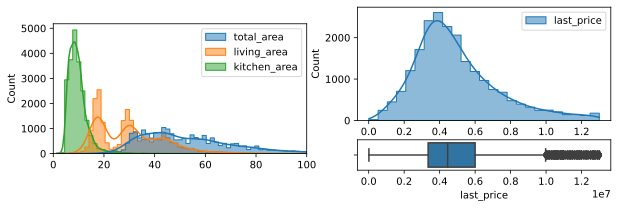

In [108]:
fig = plt.figure(figsize=(10, 3))
ax1 = plt.subplot2grid((10, 2), (1, 0), rowspan=8, fig=fig)
ax1.set_xlim(0, 100)
sns.histplot(
    ax=ax1,
    data=new_data[['total_area', 'living_area', 'kitchen_area']],
    shrink=1, 
    bins=75,
    alpha=0.5,
    element='step',
    kde=True,
    kde_kws={'bw_adjust':1.6}
);

ax2 = plt.subplot2grid((10, 2), (0, 1), rowspan=7, fig=fig)
sns.histplot(
    ax=ax2,
    data=new_data[['last_price']],
    shrink=1, 
    bins=25,
    alpha=0.5,
    element='step',
    kde=True,
    kde_kws={'bw_adjust':1.6}
);
ax3 = plt.subplot2grid((10, 2), (8, 1), rowspan=2)
sns.boxplot(data=new_data, x='last_price', ax=ax3);

* __kitchen_area__ - явный пик около 10 $м^2$, то есть в среднем площадь кухни около 10 $м^2$ - эту зависимость можно описать гауссианом
* __living_area__ - тут имеются три пика около 18, 27 и 42 $м^2$. Очень похоже, что это средние значения одно- двух- трехкомнатных квартир по отдельности. Их должно быть существенно больше, чем всех остальных, поэтому такие пики и образовались
* __total_area__ - Здесь структура похожа на `living area`, так как она составляет большую часть общей площади квартиры. Но все-таки будет некоторая усредненная картина, потому что в этом признаке учеты еще дополнительные площади (кладовая, коридоры), значения которых сильно зависят от архитектуры зданий. Тем не менее немного прорезаются три пика около 35, 42, 60 кв. метров.
* __last_price__ - получается, что в среднем цена квартиры в санкт-петербугской области около 4 млн, меданное значение состовляет около 4.5 млн. В данном графике не учитывается привязка к определенному месту, что существенно. Результаты показаны в среднем по области

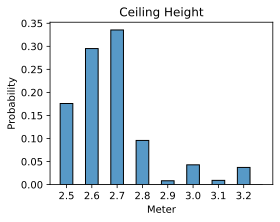

In [109]:
fig, ax = plt.subplots(figsize=(4, 3))
sns.histplot(
    ax=ax,
    x=new_data['ceiling_height'].round(1), 
    binwidth=0.05,
    stat='probability'
)
ax.set(
    title='Ceiling Height',
    xticks=np.arange(2.525, 3.3, 0.1),
    xticklabels=np.arange(2.5, 3.3, 0.1).round(1),
    xlabel='Meter'
);

* __ceiling_height__ - исходя из рисунка можно сказать, что 80% зданий сделано по новому образцу с высотами потолков не превышающих 2.8 метра. Остальные квартиры, как мы уже убедились, относятся к старому типу зданий и вероятнее всего находятся неподалеку от центра Санкт-Петербурга

Идем дальше, сначала посчитаем данные для круговых диаграмм

In [110]:
# Хочу вначале объедить в одну группу квартиры от 4 до 6 комнат
rooms = new_data.groupby('rooms')['rooms'].agg('count')
many_rooms = rooms.iloc[3:].sum()
rooms = rooms.iloc[:4]
rooms.loc[4] = many_rooms

In [111]:
flat_type = new_data.groupby('flat_type')['flat_type'].agg('count')

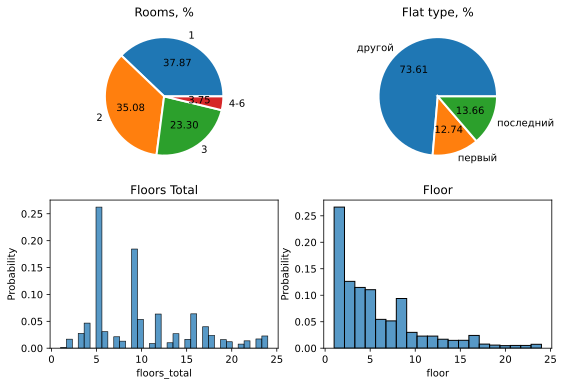

In [112]:
fig, ax = plt.subplots(2, 2, figsize=(9, 6))
ax[0, 0].pie(    
    x=rooms,
    autopct='%.2f',
    labels=["1", '2', '3', '4-6'],
    wedgeprops={'linewidth': 2, 'edgecolor': 'white'}
)
ax[0, 0].set(title='Rooms, %')

ax[0, 1].pie(    
    x=flat_type,
    autopct='%.2f',
    labels=flat_type.index,
    wedgeprops={'linewidth': 2, 'edgecolor': 'white'}
)
ax[0, 1].set(title='Flat type, %');

sns.histplot(
    data=new_data['floors_total'],
    ax=ax[1,0],
    stat="probability", 
    binrange=(1, 24)
)
ax[1, 0].set(title='Floors Total', ylabel='Probability')

sns.histplot(
    data=new_data['floor'],
    ax=ax[1, 1],
    stat="probability", 
    bins=20,
    binrange=(1, 24)
)
ax[1, 1].set(title='Floor', ylabel='Probability');


* __rooms__ - большинство квартир составляют однокомнатные и двукомнатные, приблизительно по трети от всех рассматриваемых квартир, затем 23% это трехкомнатные и остальная часть приходтся на квартиры с большим числом комнат от 4 до 6
* __floors_total__ - сильно выделяются три категории домов пяти- девяти(десяти)- и шестнадцатиэтажные дома, что неудивительно, ранее строили много пяти- десятиэтажных домов. Сегодня все чаще новостройки имеют по 16 или 24 этажа
* __floor__ - чаще всего встречаются предложения на нижних этажах. Возможно из-за того, что пятиэтажных зданий просто больше плюс нижние этажи с более высотных зданий. Интересно, что зависимость похожа на экспонециальную. Понятно, что высотных зданий меньше, следовательно и предложений о продаже на более высоких этажах меньше, но вот то, что прямо экспонента - удивительно)
* __flat_type__ - на сайтах о продаже квартир часто есть пункт "исключить первый и(или) последний этаж". Видимо, это часто нежелательные этажи. Тут их чуть больше четверти от всех имеющихся предложений

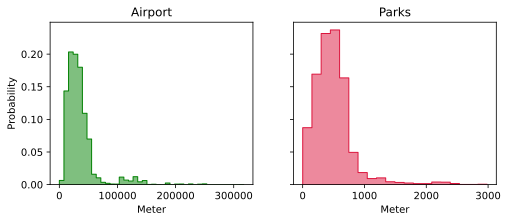

In [113]:
fig, ax = plt.subplots(1, 2, figsize=(8, 3), sharey=True)
sns.histplot(
    ax=ax[0],
    data=new_data['airports_nearest'],
    color='green',
    bins=40,
    element='step',
    stat='probability',
    alpha=0.5
)
ax[0].set(title='Airport', xlabel="Meter")

sns.histplot(
    ax=ax[1],
    data=new_data['parks_nearest'],
    color='crimson',
    bins=20,
    element='step',
    stat='probability',
    alpha=0.5
)
ax[1].set(title='Parks', xlabel="Meter");

* __airports_nearest__ - виднеется несколько пиков: первый - очевидно, из петербурга и его окрестностей,
второй из ближней области и самые отдаленные точки, где на противоположном краю области скорее всего
* __parks_nearest__ - часто парки есть в пешей доступности. Приблизительно 500 метров

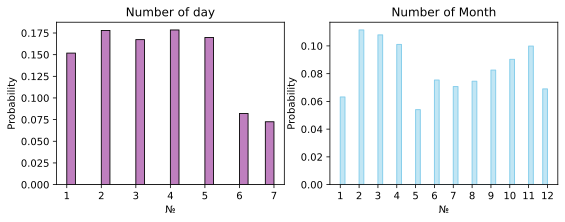

In [114]:
fig, ax = plt.subplots(1, 2, figsize=(9, 3))
sns.histplot(
    ax=ax[0],
    data=new_data['first_day'],
    color='purple',
    bins=7,
    binwidth=0.25,
    stat='probability',
    alpha=0.5
)
ax[0].set(
    title='Number of day', xlabel="№",
    xticks=np.arange(7),
    xticklabels=range(1, 8),
)

sns.histplot(
    ax=ax[1],
    data=new_data['first_month'],
    color='skyblue',
    bins=12,
    binwidth=0.25,
    element='step',
    stat='probability',
    alpha=0.5
)
ax[1].set(
    title='Number of Month', 
    xlabel="№",
    xticks=list(range(1, 13))
);

* __first_day__ - со днем недели все понятно - люди работают в основном в будние дни, поэтому в эти пять дней объявлений примерно одинаковое количество и оно выше чем в выходные
* __first_month__ - вот тут не могу сказать почему так. Много предложений появляется с февраля по апрель включительно и видно, что после спада летом идет повышение числа объевлений сплоть до декабря месяца. В декабре и январе, видимо, людям не до продаж квартир)


#### Задание 2. Исследование скорости продажи квартир

- Постройте гистограмму.
    - Посчитайте среднее и медиану.
    - В ячейке типа markdown опишите, сколько обычно занимает продажа. Какие продажи можно считать быстрыми, а какие — необычно долгими?"

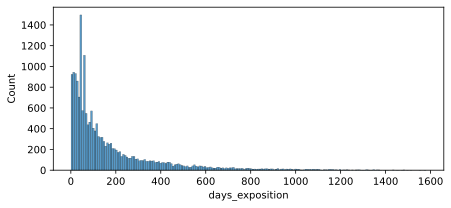

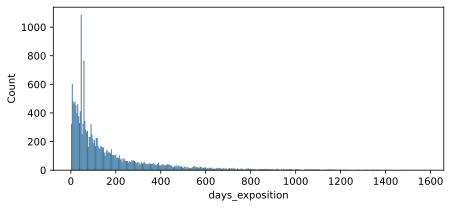

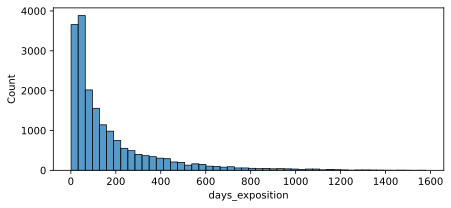

In [115]:
plt.figure(figsize=(7, 3))
sns.histplot(data=new_data, x='days_exposition', bins=200)
plt.figure(figsize=(7, 3))
sns.histplot(data=new_data, x='days_exposition', bins=400)
plt.figure(figsize=(7, 3))
sns.histplot(data=new_data, x='days_exposition', bins=50);

Есть два странных пика, если увеличивать число бинов их не видно при малом количестве бинов - замазываются. (Для гистограмм и графиков огибающей - обычно дело)
Посмотрим ближе

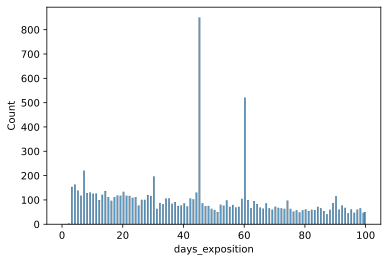

In [116]:
sns.histplot(data=new_data, x='days_exposition', bins=200, binrange=(0, 100));

Видно четко два пика на 45 и 61 день. Какая-то скидка в эти дни?! Тут не знаю, что можно сказать, какая-то искусственная природа у этих пиков. Еще выбиваются на 5-ый и 30-ый дни, но не так сильно 

In [117]:
print(f"Среднее значение: {new_data['days_exposition'].mean()}")
print(f"Медианное значение: {new_data['days_exposition'].median()}")

Среднее значение: 173.07391257536605
Медианное значение: 91.0


Если закрыть глаза на два пика, у которых как мне кажется неестественная природа (может, есть рекомендация пересоздавать объявление, но почему именно через 45 и 61 день - не знаю), то в целом я бы ориентировался на медиану, что квартиру можно продать примерно за 91 день. 

Есть очень старые объявления (и их приличное количество), которые висят больше года, из-них и среднее значение так сильно проседает. 

#### Задание 3. Определение факторов, влияющих на общую стоимость объекта

Выделим требуемые признаки, чтобы ничего другое не мешалось

In [118]:
to_observe = [
    'total_area', 'living_area', 'kitchen_area', 
    'rooms', 'floor', 'first_day', 'first_month',
    'first_year', 'last_price'
]

In [119]:
work_data = new_data[to_observe]

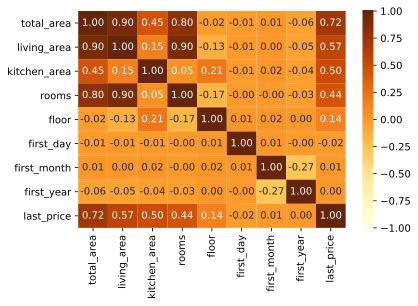

In [120]:
fig, ax = plt.subplots(figsize=(6, 4))
sns.heatmap(work_data.corr(), annot=True, ax=ax, fmt=".2f", cmap=plt.cm.YlOrBr, vmin=-1, vmax=1);

Для нас тут важен только последний стоблец или строка. В нем / ней показана корреляция между ценой и нашими признаками. Сразу видно, что больше всего на цену влияет __общая площадь квартиры__, чем площадь больше, тем цена выше. Следующим идет __жилая площадь__, которая тесно связана с общей площадью, так как обычно является основной ее частью, что также видно на матрице корреляций (коэффициент между ними 0.92). Далее идут __площадь кухни__ и __число комнат__. Есть также небольшая связь стоимости жилья и этажом, на котором находится квартира, получается что нижние этаже чуть дешевле верхних. 

Остальные параметры никак не связаны с ценой жилья.

<div class="alert alert-block alert-info">
<h2> Комментарий Студента<a class="tocSkip"></h2>

Получается, что не полностью задание сделал. 
Ниже постарался учесть все замечания.
</div>

<div class="alert alert-success"> 
<h2> Комментарий ревьюера #2 <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> 
    
Ниже, получилось отличное визуальное представление данных. Единcтвенная рекомендация - предыдущее решение лучше закомментировать~.

In [121]:
to_observe = [
    'last_price', 'total_area', 'living_area', 'kitchen_area', 
    'rooms', 'floor', 'first_day', 'first_month',
    'first_year', 'flat_type'
]

In [122]:
work_data = new_data[to_observe]

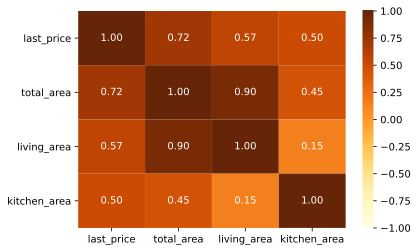

In [123]:
fig, ax = plt.subplots(figsize=(6, 4))
# to_observe[:4] - оставляем количественные признаки + last_price
sns.heatmap(work_data[to_observe[:4]].corr(), 
            annot=True, 
            fmt=".2f", 
            ax=ax, 
            cmap=plt.cm.YlOrBr, 
            vmin=-1, vmax=1
);

Для нас тут важен только первый стоблец или строка. В нем / ней показана корреляция между ценой и нашими признаками. Сразу видно, что больше всего на цену влияет __общая площадь квартиры__, чем площадь больше, тем цена выше. Следующим идет __жилая площадь__, которая тесно связана с общей площадью, так как обычно является основной ее частью, что также видно на матрице корреляций (коэффициент между ними 0.90). Далее идет __площадь кухни__. 

Оценим для наглядности еще и на диаграммах рассеяния

In [124]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4), sharey=True)
work_data.plot(x='total_area',  y='last_price', kind='scatter', ax=ax[0], alpha=0.25, color='green')
work_data.plot(x='living_area', y='last_price', kind='scatter', ax=ax[1], alpha=0.25, color='green')
work_data.plot(x='kitchen_area',y='last_price', kind='scatter', ax=ax[2], alpha=0.25, color='green');

Тоже видно, что корреляция есть, но у `total_area` наиболее сильная 

Далее, посмотрим как менялась цена от даты размещения и от типа этажа

In [125]:
price_from_floor = work_data.pivot_table(index='flat_type', values='last_price', aggfunc=['mean', 'median'])
price_from_floor.columns = ['mean', 'median']
price_from_floor = price_from_floor.reset_index()


Преобразования для графика

In [126]:
df1 = price_from_floor.iloc[:, :2]
df1 = df1.rename(columns={'mean': 'last_price', 'median':'type'})
df1['type'] = 'mean'

df2 = price_from_floor.iloc[:, [0, 2]]
df2 = df2.rename(columns={'mean': 'type', 'median':'last_price'})
df2['type'] = 'median'

In [127]:
bars = pd.concat((df1, df2), ignore_index=True)

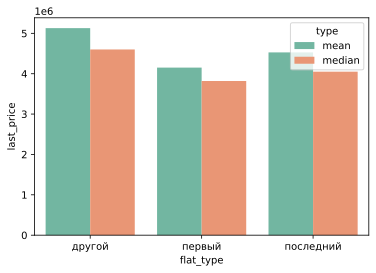

In [128]:
sns.barplot(
    data=bars, 
    x='flat_type', 
    y='last_price', hue='type', 
    palette=sns.color_palette("Set2"),
);

Квартиры на первом этаже дешевле и скорее всего менее предпочтительные. Наиболее дорогими квартирами по типу являются те, что находятся между первым и последним этажами.

Теперь проанализируем цены в зависимости от даты размещения объвления.

In [129]:
def get_bars(table): 
    """Функция будет преобразовывать данные для barplot"""
    df1 = table.iloc[:, :2]
    df1 = df1.rename(columns={'mean': 'last_price', 'median':'type'})
    df1['type'] = 'mean'

    df2 = table.iloc[:, [0, 2]]
    df2 = df2.rename(columns={'mean': 'type', 'median':'last_price'})
    df2['type'] = 'median'
    return pd.concat((df1, df2))

In [130]:
price_from_day = work_data.pivot_table(
    values='last_price',
    index='first_day', aggfunc=['mean', 'median']
)
price_from_day.columns = ['mean', 'median']
price_from_day = price_from_day.reset_index()

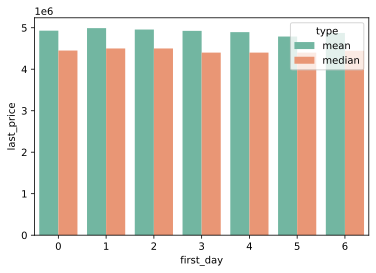

In [131]:
sns.barplot(
    data=get_bars(price_from_day), 
    x='first_day', 
    y='last_price', hue='type', 
    palette=sns.color_palette("Set2"),
);

Зависимости от дня недели не наблюдается

In [132]:
price_from_month = work_data.pivot_table(
    values='last_price',
    index='first_month', aggfunc=['mean', 'median']
)
price_from_month.columns = ['mean', 'median']
price_from_month = price_from_month.reset_index()

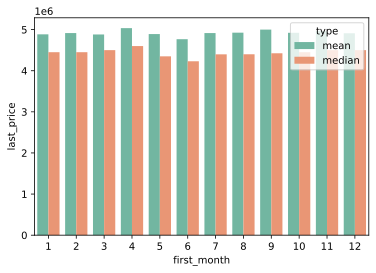

In [133]:
sns.barplot(
    data=get_bars(price_from_month), 
    x='first_month', 
    y='last_price', hue='type', 
    palette=sns.color_palette("Set2"),
);

Немного просаживается значение в летние месяцы 

In [134]:
price_from_year = work_data.pivot_table(
    values='last_price',
    index='first_year', aggfunc=['mean', 'median']
)
price_from_year.columns = ['mean', 'median']
price_from_year = price_from_year.reset_index()

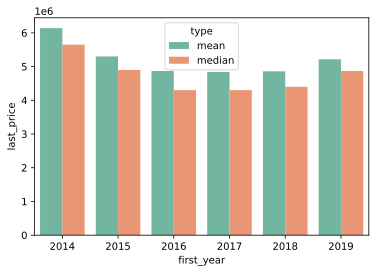

In [135]:
sns.barplot(
    data=get_bars(price_from_year), 
    x='first_year', 
    y='last_price', hue='type', 
    palette=sns.color_palette("Set2"),
);

C 2014 по 2016 годы наблюдался спад цен на квартиры, начиная с 2018 вновь начался медленный рост

#### Задание 4. Рейтинг стоимости квадратного метра в разных населенных пунктах
Определим среднюю цену одного квадратного метра в 10 нп с наибольшим числом объявлений

In [136]:
rating = new_data.pivot_table(
    index='locality_name', 
    values='price_per_m2', 
    aggfunc=['count', 'mean']
)

In [137]:
rating.columns = ['number_of_adv', 'mean_price_per_m2']

Забираем только топ-10 по числу объявлений

In [138]:
rating = rating.sort_values(by='number_of_adv', ascending=False).reset_index()
rating = rating.iloc[:10, :]

Получилась такая табличка

In [139]:
rating

,locality_name,number_of_adv,mean_price_per_m2
0,санкт-петербург,13654,106324.047649
1,мурино,586,86041.116064
2,поселок шушары,437,78517.154475
3,всеволожск,391,67154.780861
4,колпино,334,75415.488034
5,пушкин,333,100748.559238
6,поселок парголово,325,90362.345200
7,гатчина,301,68729.583139
8,деревня кудрово,299,92473.547576
9,выборг,221,58130.039124


2. Выделим нп с самой высокой и низкой стоимость 1 кв метра

In [140]:
rating = rating.sort_values(by='mean_price_per_m2', ascending=False).reset_index(drop=True)
rating

,locality_name,number_of_adv,mean_price_per_m2
0,санкт-петербург,13654,106324.047649
1,пушкин,333,100748.559238
2,деревня кудрово,299,92473.547576
3,поселок парголово,325,90362.345200
4,мурино,586,86041.116064
5,поселок шушары,437,78517.154475
6,колпино,334,75415.488034
7,гатчина,301,68729.583139
8,всеволожск,391,67154.780861
9,выборг,221,58130.039124


In [140]:
print(f'Самая высокая стоимость 1 кв/м в {rating.loc[0, "locality_name"]}е и равна {rating.loc[0, "mean_price_per_m2"] / 1000:.1f} тысячи')

Самая высокая стоимость 1 кв/м в санкт-петербурге и равна 106.3 тысячи


In [141]:
print(f'Самая низкая стоимость 1 кв/м в {rating.loc[9, "locality_name"]}е и равна {rating.loc[9, "mean_price_per_m2"] / 1000:.1f} тысяч')

Самая низкая стоимость 1 кв/м в выборге и равна 58.1 тысяч


В нашем топе получилось, что самая большая средняя стоимость квадратного метра жилья оказалась в санкт-петербурге и равна 106.3 тысячи. Также в топ-3 вошли город пушкин и город кудрово на окраине Петербурга (специально проверил, это не деревня:) Такая вот опечатка закралась)

Самым дешевым ценником за квадратный метр в нашей выборке может похвастать Выборг за него просят 58.1 тысячу

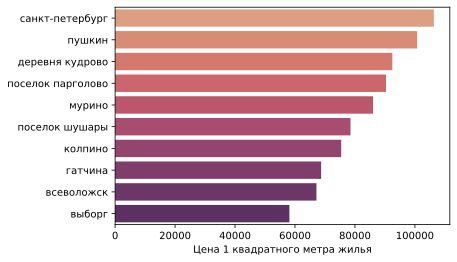

In [141]:
fig, ax = plt.subplots(figsize=(6, 4))
sns.barplot(data=rating, y='locality_name', x='mean_price_per_m2',
    ax=ax, 
    palette='flare'
)
ax.set_xlabel("Цена 1 квадратного метра жилья")
ax.set_ylabel("")
ax.set_yticklabels(rating['locality_name']); 

#### Задание 5. Изменеие стоимости квартиры по мере удаленности от центра Санкт-Петербурга

In [142]:
spb_data = new_data.query('locality_name == "санкт-петербург"')
spb_data = spb_data.loc[:, ['last_price', 'city_centers_km']]

In [143]:
spb_mean = spb_data.pivot_table(
    index='city_centers_km', 
    values=['last_price'], 
    aggfunc=lambda x: np.mean(x) / 1e06  # чтобы цена в млн была
).reset_index()

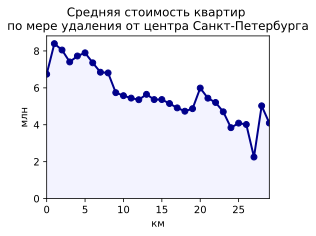

In [144]:
fig, ax = plt.subplots(figsize=(4, 3))
ax.plot(spb_mean['city_centers_km'], spb_mean['last_price'], color='darkblue', lw=2, marker='o')
ax.fill_between(spb_mean['city_centers_km'], spb_mean['last_price'], 0, 
                color='blue',
                alpha=0.05,
)
ax.set(
    title='Средняя стоимость квартир \nпо мере удаления от центра Санкт-Петербурга',
    ylabel='млн',
    xlabel='км',
    xlim=(0, spb_mean['city_centers_km'].max()), 
    ylim=0
);

Тут важно помнить, что мы анализируем квартиры не относящиеся к элитным. Но даже не смотря на это цена падает по мере удаления от центра города. Провал при нулевом значении мог появиться просто из-за такой выборки.

Для справедливости построем это же распределение, но на полных данных

In [145]:
# Нужно добавить расстояние от центра в км
data['city_centers_km'] = data['city_centers_nearest'] / 1000
data['city_centers_km'] = data['city_centers_km'].round(0)

In [146]:
spb_data = data.query('locality_name == "санкт-петербург"')
spb_data = spb_data.loc[:, ['last_price', 'city_centers_km']]

In [147]:
spb_mean = spb_data.pivot_table(
    index='city_centers_km', 
    values=['last_price'], 
    aggfunc=lambda x: np.mean(x) / 1e06  # чтобы цена в млн была
).reset_index()

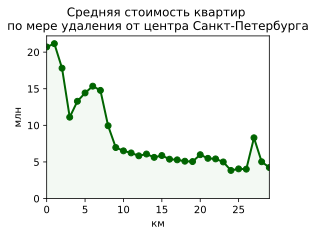

In [148]:
fig, ax = plt.subplots(figsize=(4, 3))
ax.plot(spb_mean['city_centers_km'], spb_mean['last_price'], color='darkgreen', lw=2, marker='o')
ax.fill_between(spb_mean['city_centers_km'], spb_mean['last_price'], 0, 
                color='green',
                alpha=0.05,
)
ax.set(
    title='Средняя стоимость квартир \nпо мере удаления от центра Санкт-Петербурга',
    ylabel='млн',
    xlabel='км',
    xlim=(0, spb_mean['city_centers_km'].max()), 
    ylim=0
);

Тенденция сохранилась, но все-таки теперь ближе к правде по самой цене.
Всплекс в конце может быть связан, что на окраине города есть какой-нибудь бизнес-поселок

### Общий вывод

После проведенного анализа можно сделать следующие выводы:
1. Квартиры продаются приблизительно за 50-100 дней
2. Наиболее сильно на стоимость квартиры влияет (тут имеется ввиду, что рост этих параметров делает цену выше):
   1. Ее общая площадь
   2. Жилая площадь
   3. Размер кухни
   4. Количество комнат в квартире
   5. Расположение квартиры по этажам (приоритет отдается квартирам на чуть более высоких этажах)
   
3. Дата размещения объявления не влияет на цену (было бы странно, если бы влияло)
4. В основном квартиры продаются за 50-100 дней с момента размещения объявления на сайте
5. $^*$ Самая высокая цена за единицу квадратного метра:
    1. Санкт-Петербург - 104.9 тысячи/кв.м. 
    2. Пушкин - 100 тысяч/кв.м. 
    3. Кудрово - 92.6 тысячи/кв.м. 
6. $^*$ Наиболле низкая цена за квадратные метр жилья во Всеволжске - 67.2 тысячи/кв.м.
7. Вне зависимости от разделения на элитное и обычное жилье максимальная цена за квартиру в центре Санкт-Петербуга, которая снижается по мере удаления от центра города
___
$^*$ из топ-10 населенных пунктов по числу объявлений